# Blood Smear Analysis


*   Model :- YOLO v5s
*   Dataset :- Modified BCCD dataset



## Setup

In [ ]:
!git clone https://github.com/ultralytics/yolov5 
!pip install -qr yolov5/requirements.txt 
%cd yolov5

import torch
from IPython.display import Image, clear_output  
from utils.google_utils import gdrive_download 

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.6.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


In [ ]:
%cd /content
!curl -L "https://app.roboflow.com/ds/ZJQMCYdVP7?key=a3r2gF9Z0Y" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1341      0 --:--:-- --:--:-- --:--:--  1339
100 11.9M  100 11.9M    0     0  8003k      0  0:00:01  0:00:01 --:--:--  110M
Archive:  roboflow.zip
 extracting: test/images/BloodImage_00090_jpg.rf.04325ebf61fbeebec96b1cc0634bf9d7.jpg  
 extracting: test/images/BloodImage_00227_jpg.rf.50dc96e5c4317d014b77414b217f469c.jpg  
 extracting: test/images/BloodImage_00369_jpg.rf.0257bdc83aa131367f6f73dff974fb2f.jpg  
 extracting: test/images/BloodImage_00120_jpg.rf.45dba1979f9ec81b2f3e4135a84e0411.jpg  
 extracting: test/images/BloodImage_00359_jpg.rf.16c01e5d87b5242cd6c1b66d2cb6fa6a.jpg  
 extracting: test/images/BloodImage_00254_jpg.rf.22887f4504afce6b1cf2ce3d3c9fc0f8.jpg  
 extracting: test/images/BloodImage_00241_jpg.rf.2dac29970eda2b33d510d5366eebab71.jpg  
 extracting: test/images/BloodImage_

In [ ]:
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml
'''
 layers : 191
 parameters : 7.5M
'''
nc: 3  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

## Training

In [ ]:
# train yolov5s on custom data for 50 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5m_results  --cache

/content/yolov5
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='../data.yaml', device='', epochs=100, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', img_size=[416, 416], local_rank=-1, logdir='runs/', multi_scale=False, name='yolov5m_results', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
2020-08-31 03:20:04.957903: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## Analysis
### Training Images

GROUND TRUTH TRAINING DATA:


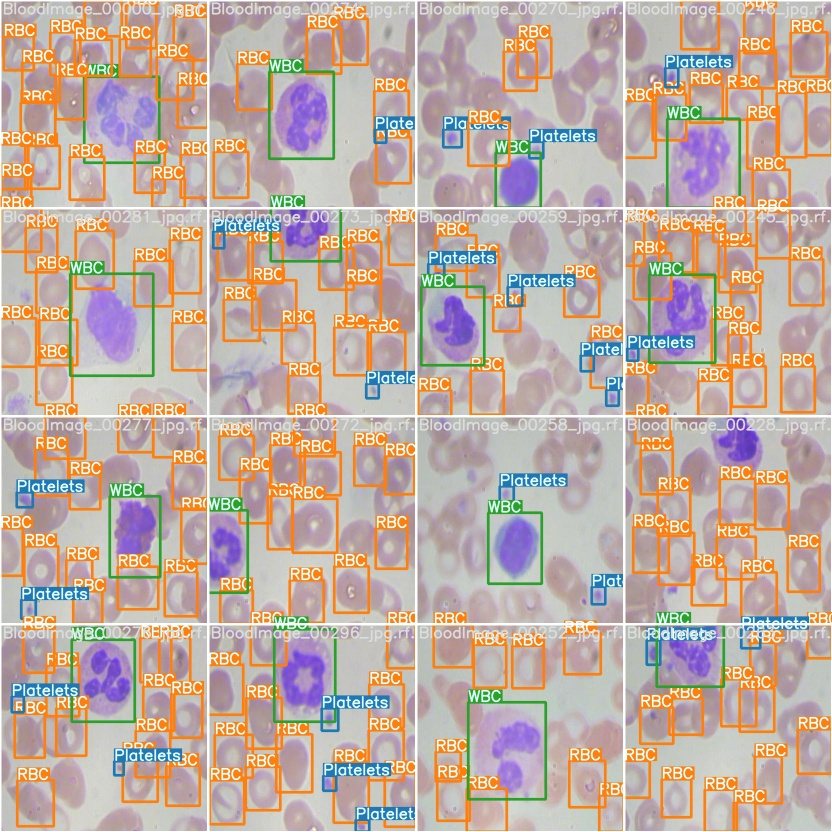

In [ ]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/exp0_yolov5m_results/test_batch0_gt.jpg', width=900)

### Test Images

In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/exp0_yolov5m_results/weights/last_yolov5m_results.pt --img 416 --conf 0.1 --source ../test/images


/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='../test/images', update=False, view_img=False, weights=['/content/yolov5/runs/exp0_yolov5m_results/weights/last_yolov5m_results.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 140 layers, 7.25191e+06 parameters, 6.61683e+06 gradients
image 1/36 /content/test/images/BloodImage_00038_jpg.rf.645fc3a754cf6ed5142f2d7218c62bf3.jpg: 416x416 1 Plateletss, 38 RBCs, 1 WBCs, Done. (0.011s)
image 2/36 /content/test/images/BloodImage_00044_jpg.rf.a45cc108a4db410c15dfb47b1a18340d.jpg: 416x416 6 Plateletss, 32 RBCs, 2 WBCs, Done. (0.010s)
image 3/36 /content/test/images/BloodImage_00062_jpg.rf.4d3cd9f145044c39bb01dd73ff920103.jpg: 416x416 3 Plateletss, 26 RBCs, 1 WBCs, Done. (0.010s)
image 4/36 /content/test/images/BloodImage_00090_jpg.rf.04325ebf61fb

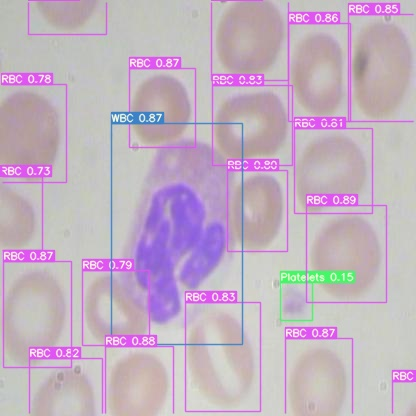

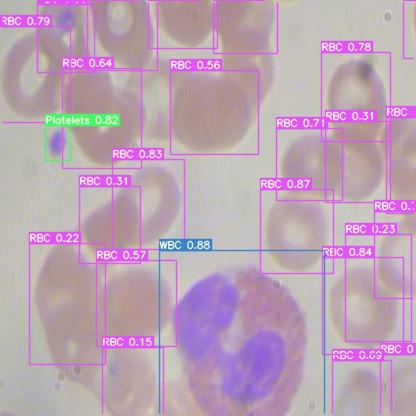

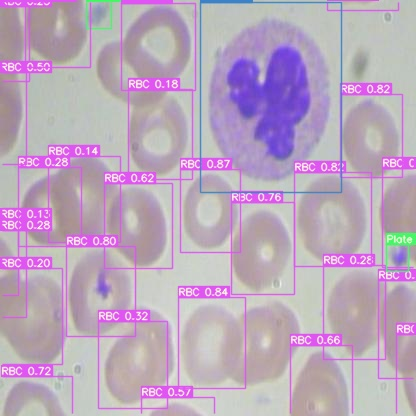

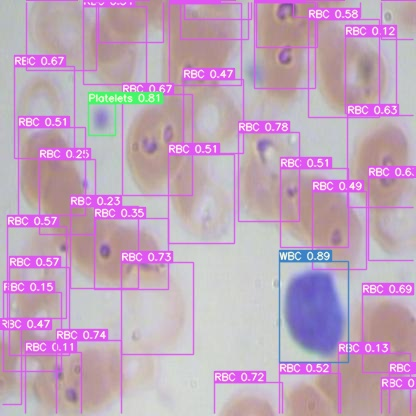

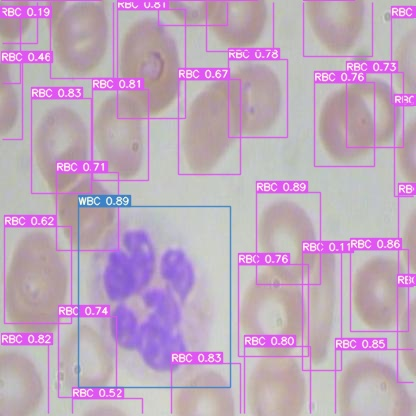

...

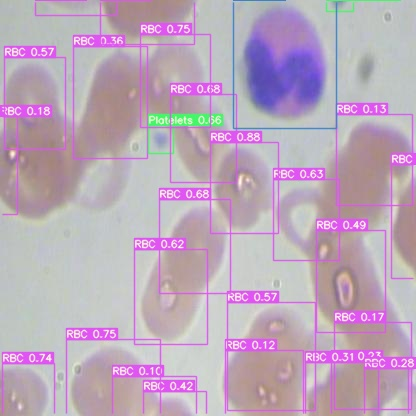

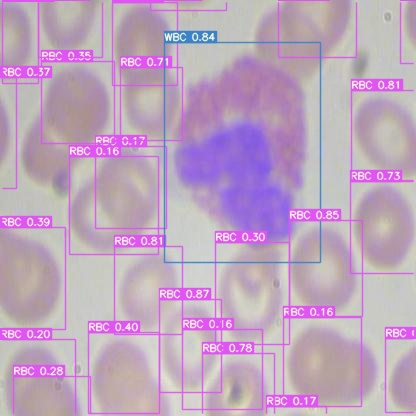

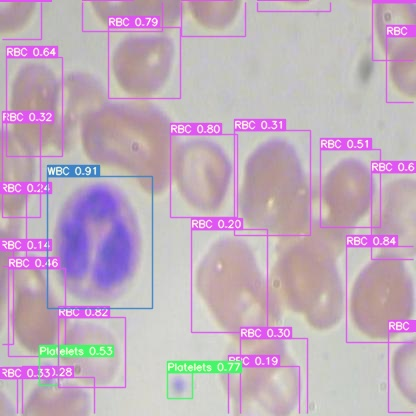

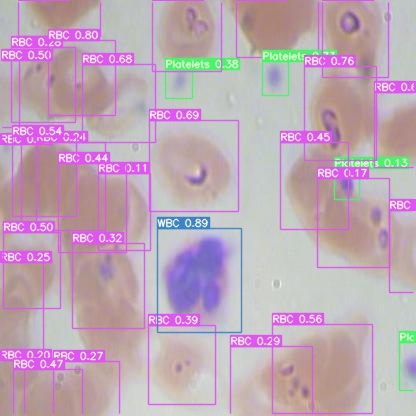

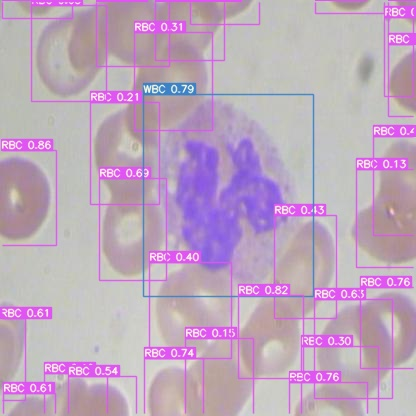

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/exp0_yolov5m_results/weights/last_yolov5m_results.pt /content/gdrive/My\ Drive/Colab\ Notebooks/Weights/